# Latent Space Analyser

this notebook describes ways to analyse outputs from RELION multibody refinement, cryoSPARC 3D Variability tool, or any latent space provided as particles coordinates in a given number of dimensions.

## A. Load useful python libraries
We will package our tools in a library soon, in the meantime, make sure you have `our_library` point to the proper directory:

In [1]:
our_library = '/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/src/'

In [2]:
# just run this cell, no need to edit
%matplotlib inline
import shutil, os, sys, glob
import numpy as np
from matplotlib import pyplot as plt
import ipyvolume as ipv
sys.path.append(our_library)
import cryoemio
import imutils
import dataviz
import mrcutils
import componentutils
import clusterutils

## B1. Analyse latent space given by RELION multibody refinement

In [3]:
data_directory = '/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/notebooks/Material/Heterogeneity/Multibody/'

We need both the projection and eigenvector files output by RELION:

In [4]:
projection_file  = data_directory+'analyse_projections_along_eigenvectors_all_particles.txt'
eigenvector_file = data_directory+'analyse_eigenvectors.dat'

The following function returns the coordinates of all the particles in the dataset, while plotting the meaning of the eigenvectors in term of the rotation-translation contribution of the bodies, together with their associated eigenvalue that can be interpreted as their importance

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 461561


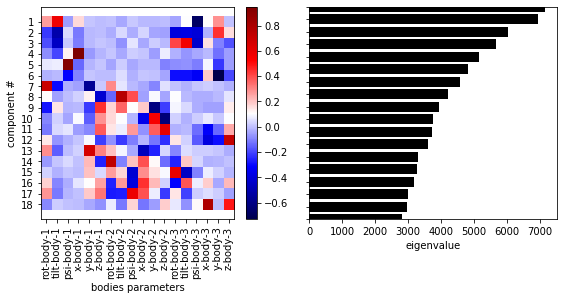

In [5]:
particles_coordinates = componentutils.get_relion_projections(projection_file, eigenvector_file)

The eigenvalue distribution does not allow to clearly identify signal. Maybe removing some background would help. We can try to cluster as a gaussian mixture model. Let's try several:

In [6]:
clusterutils.scan_gmm(particles_coordinates)

 BIC( 1 ) =  -84248190.65468438 BIC( 2 ) =  -86918837.58654939 BIC( 3 ) =  -87200604.97337528 BIC( 4 ) =  -87471633.59758605 BIC( 5 ) =  -87487178.38535842

KeyboardInterrupt: 

According to the Bayesian Information Criterion (BIC), a two-gaussian mixture model seems to be relevant. We thus assign their cluster to all the particles, and visualize their disrtibution in the latent space.

In [6]:
assignment, index = clusterutils.assign_gmm(particles_coordinates,n_components=2)

. component  0  has  413315  particles
. component  1  has  48246  particles


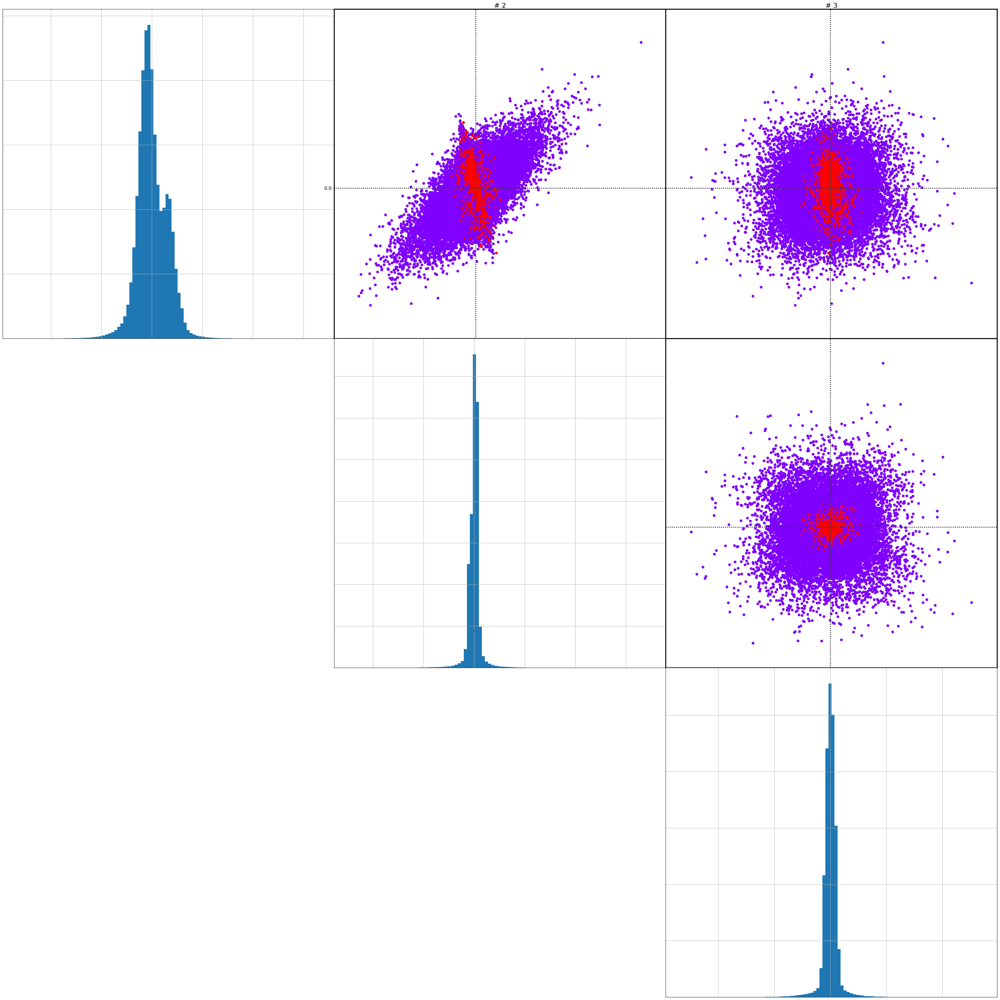

In [9]:
dataviz.biplots(particles_coordinates,n=3,nbins=100,figsize=6, show_histo=True, c=assignment)

The dataset can now be split and each subset written to a file, that can each be analysed again.

Number of dimensions : 18
Number of components : 18
Number of particles  : 461561


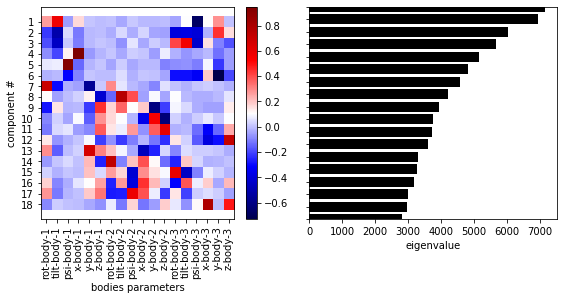

In [7]:
componentutils.split_relion_projections(projection_file, eigenvector_file, c=assignment, keyword=data_directory+'split_')

In [8]:
glob.glob(data_directory+'split_*')

['/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/notebooks/Material/Heterogeneity/Multibody/split__cluster_0_projs.dat',
 '/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/notebooks/Material/Heterogeneity/Multibody/split__eigvec.dat',
 '/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/notebooks/Material/Heterogeneity/Multibody/split__cluster_1_projs.dat']

Load data [check out eigenvectors and eigenvalues]:
Number of dimensions : 18
Number of components : 18
Number of particles  : 413315


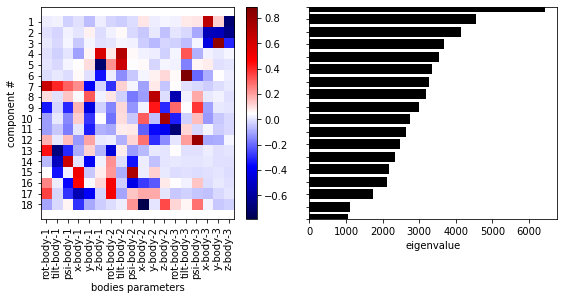

In [5]:
particles_coordinates_new = componentutils.get_relion_projections(data_directory+'split__cluster_0_projs.dat', data_directory+'split__eigvec.dat', as_is=False)

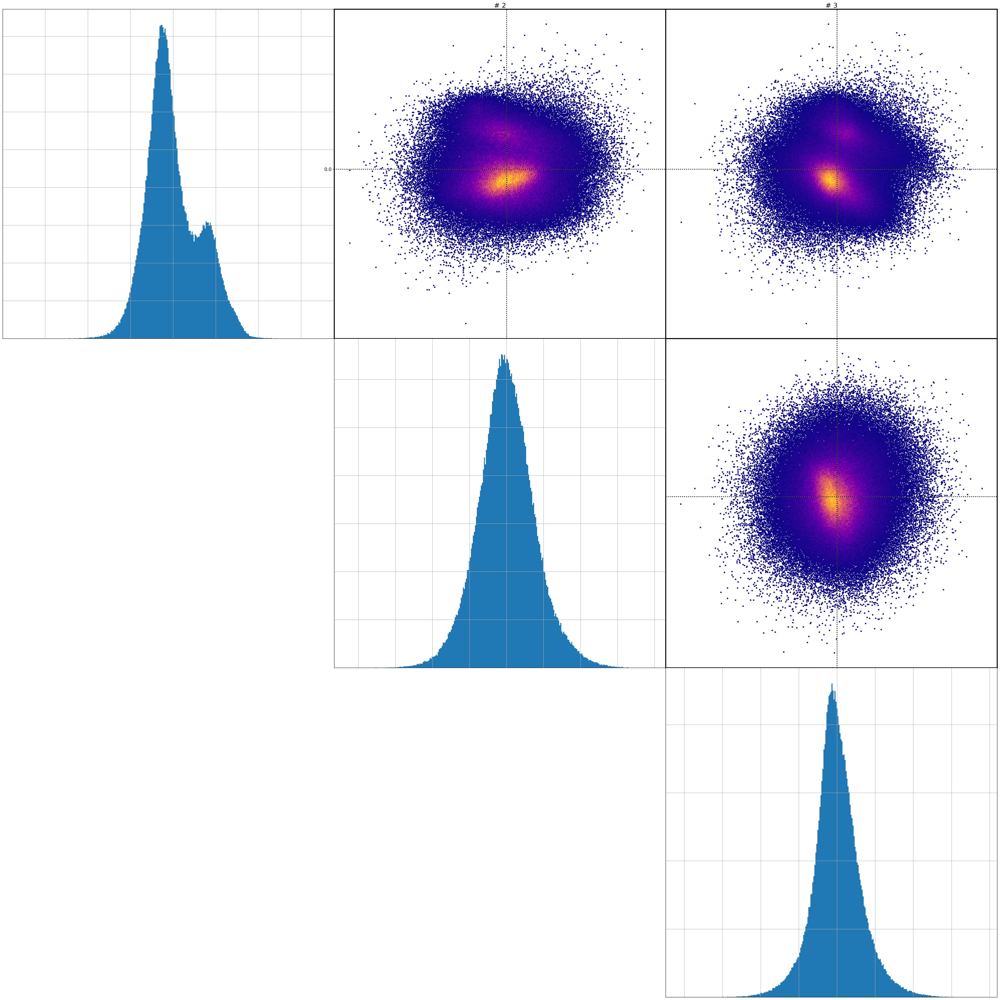

In [7]:
dataviz.biplots(particles_coordinates_new,n=3,nbins=300,figsize=6,show_histo=True)

## B2. Analyse latent space given by cryoSPARC 3D Variability tool

In [8]:
data_directory = '/home/fpoitevi/notebooks/cryo_home/slaclab/cryoEM-notebooks/notebooks/Material/Heterogeneity/cryoSPARC/'

cryoSPARC stores the information on particles coordinates in the latent space in the following file:

In [9]:
projection_file = data_directory+'cryosparc_P5_J32_particles.cs'

In [10]:
particles_coordinates = componentutils.get_cryosparc_projections(projection_file)

Load coordinates:
Number of components : 3
Number of particles  : 236384


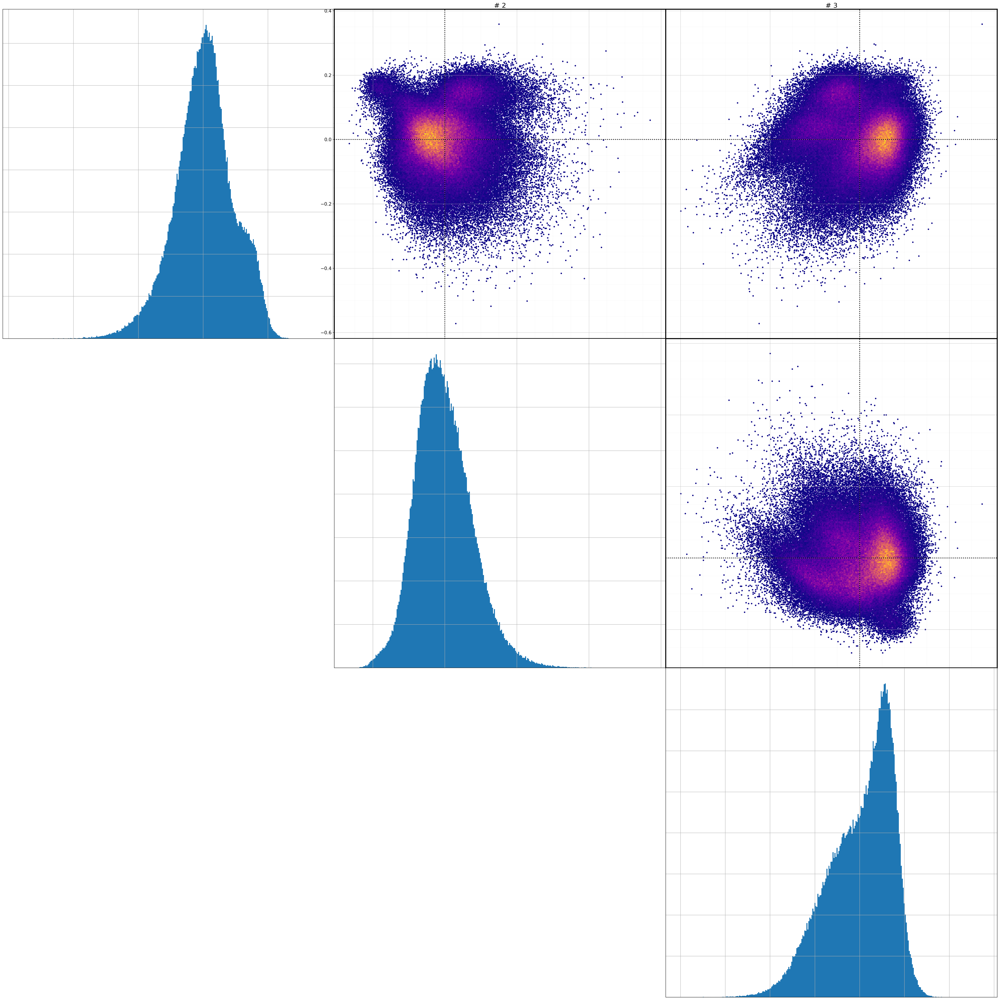

In [11]:
dataviz.biplots(particles_coordinates,n=3,nbins=300,figsize=6,show_histo=True)

K-mean clustering